# Testing the Forward process

The goal is to assess whether the forward process proceed as expected and whether the actual noised images do reflect the expected marginal distirbution.

In [9]:
import sys, importlib, os
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import torchvision.utils
from torch.utils.data import DataLoader
from typing import Tuple
import yaml
from pathlib import Path
from datetime import datetime

from torchvision import datasets, transforms
from torch.utils.data import Subset

import matplotlib.pyplot as plt
from torchvision.utils import make_grid

## Defining Parameters

In [2]:
#configuarations
IMAGE_SIZE = 256
VAE_SCALE_FACTOR = 0.18215

sde_type = "subvp"
num_steps = 1000

In [3]:
cfg = {
    "sde_type": sde_type,
    "N" : num_steps
}

In [4]:
# Importing project packages
cwd = Path(os.getcwd())
root_dir = cwd.parent

utils_dir = root_dir.joinpath('src','utils')

sys.path.append(str(root_dir))

In [6]:
from src.utils import WIP_SDE, WIP_processes


importlib.reload(WIP_SDE)
importlib.reload(WIP_processes)

from src.utils.WIP_SDE import VESDE, SubVPSDE
from src.utils.WIP_processes import Diffusion_Processes

In [10]:
image_size = IMAGE_SIZE
transform = transforms.Compose([transforms.CenterCrop(178), transforms.Resize((image_size, image_size)), transforms.ToTensor(), transforms.Normalize([0.5]*3, [0.5]*3)])

full_dataset = datasets.CelebA(
    root="../../data",
    split="train",
    target_type="attr",
    transform=transform,
    download=False
)

N = 64  # number of images you want
small_dataset = Subset(full_dataset, range(N))

In [11]:
loader = DataLoader(small_dataset, batch_size=64, shuffle=True)

In [12]:
images, labels = next(iter(loader))

## Printing Images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


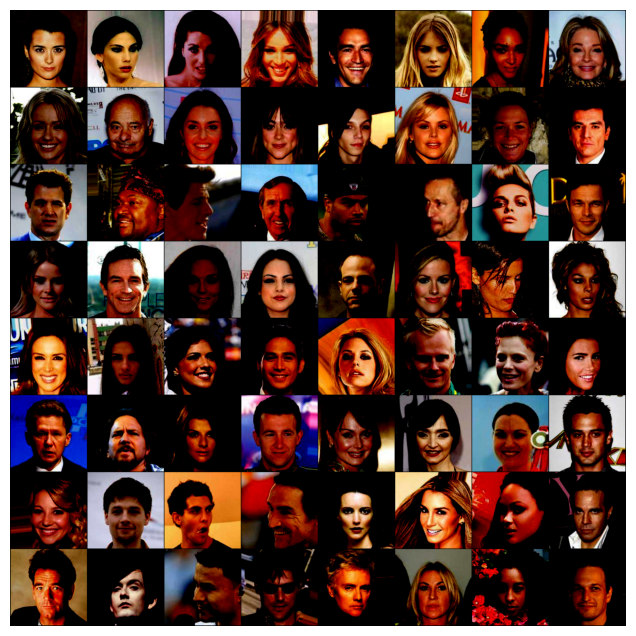

In [13]:
grid = make_grid(images, nrow=8)      # 8×8 grid if batch=64

plt.figure(figsize=(8,8))
plt.imshow(grid.permute(1, 2, 0))     # CHW → HWC
plt.axis("off")
plt.show()

In [14]:
images.shape

torch.Size([64, 3, 256, 256])

# Encoding

In [15]:
from diffusers import AutoencoderKL
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse").eval()

In [ ]:
# transforms.Normalize([0.5]*3, [0.5]*3)

In [16]:
enc_images = images.to(vae.device)

with torch.no_grad():
    latent_dist = vae.encode(enc_images)
    latents = latent_dist.latent_dist.sample()   # or .mean for deterministic
    latents = latents * VAE_SCALE_FACTOR         # scale as required by SD

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.152631..7.940733].


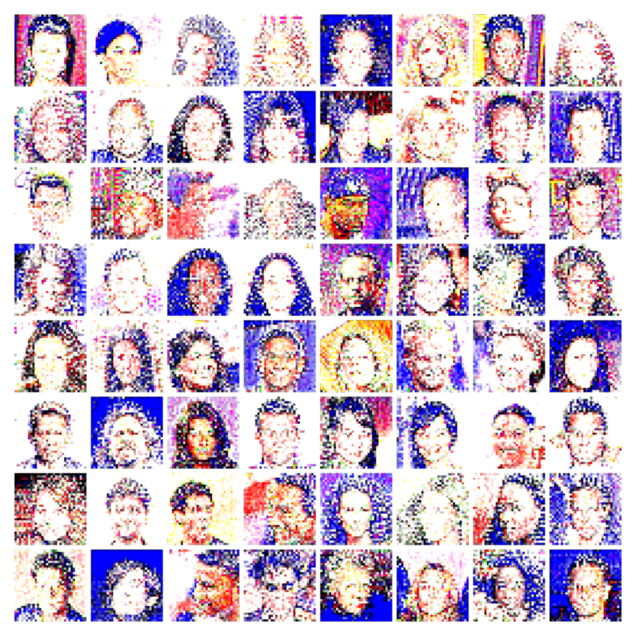

In [17]:
grid = make_grid(latents, nrow=8)      # 8×8 grid if batch=64

plt.figure(figsize=(8,8))
plt.imshow(grid.permute(1, 2, 0))     # CHW → HWC
plt.axis("off")
plt.show()

In [18]:
latents.shape

torch.Size([64, 4, 32, 32])

# Forward test

In [19]:
def summarize_and_plot(name, z):
    # flatten to 1D
    z_flat = z.detach().cpu().flatten()

    # statistics
    mean = z_flat.mean()
    std = z_flat.std(unbiased=False)

    z_standard = (z_flat - mean) / std
    skew = torch.mean(z_standard ** 3)
    kurt = torch.mean(z_standard ** 4)

    # print stats
    print(f"{name} statistics:")
    print(f"mean      = {mean.item():.6f}")
    print(f"std       = {std.item():.6f}")
    print(f"skew      = {skew.item():.6f}")
    print(f"kurtosis  = {kurt.item():.6f}")
    print()

    # histogram
    plt.figure(figsize=(6,4))
    plt.hist(z_flat.numpy(), bins=100, density=True)
    plt.title(f"Histogram of {name}")
    plt.xlabel(name)
    plt.ylabel("density")
    plt.show()

In [24]:
def per_image_stats_average(z):
    # z shape: (B, C, H, W)
    B = z.size(0)
    z_cpu = z.detach().cpu()

    means = []
    stds = []
    skews = []
    kurts = []

    for i in range(B):
        zi = z_cpu[i].flatten()

        m = zi.mean()
        s = zi.std(unbiased=False)

        zstd = (zi - m) / s
        sk = torch.mean(zstd ** 3)
        kt = torch.mean(zstd ** 4)

        means.append(m)
        stds.append(s)
        skews.append(sk)
        kurts.append(kt)

    # averages across images
    avg_mean = torch.stack(means).mean()
    avg_std  = torch.stack(stds).mean()
    avg_skew = torch.stack(skews).mean()
    avg_kurt = torch.stack(kurts).mean()

    print("Averaged per-image statistics:")
    print(f"mean      = {avg_mean.item():.6f}")
    print(f"std       = {avg_std.item():.6f}")
    print(f"skew      = {avg_skew.item():.6f}")
    print(f"kurtosis  = {avg_kurt.item():.6f}")

    return avg_mean, avg_std, avg_skew, avg_kurt

In [20]:
diffusion_process = Diffusion_Processes(cfg)

# Noise Schedule graph

# Images test

In [21]:
zt, t, eps = diffusion_process.forward_process(latents)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.95438..6.755695].


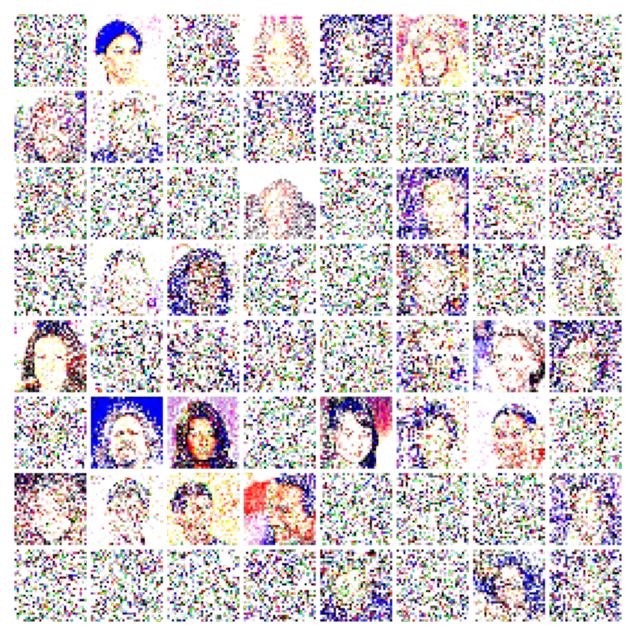

In [22]:
grid = make_grid(zt, nrow=8)      # 8×8 grid if batch=64

plt.figure(figsize=(8,8))
plt.imshow(grid.permute(1, 2, 0))     # CHW → HWC
plt.axis("off")
plt.show()

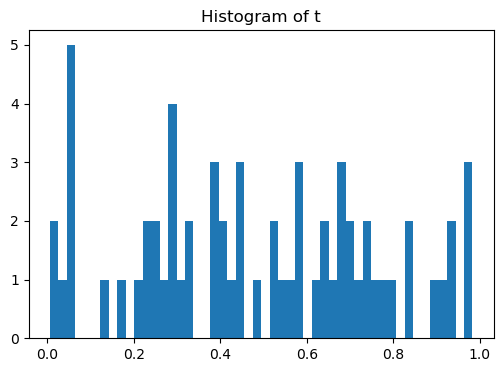

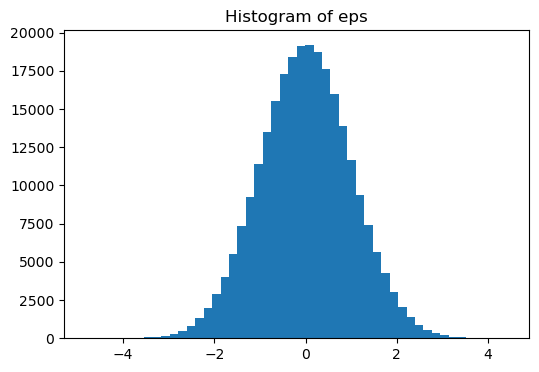

In [23]:
t_cpu = t.detach().cpu().flatten()
eps_cpu = eps.detach().cpu().flatten()

plt.figure(figsize=(6,4))
plt.hist(t_cpu, bins=50)
plt.title("Histogram of t")
plt.show()

plt.figure(figsize=(6,4))
plt.hist(eps_cpu, bins=50)
plt.title("Histogram of eps")
plt.show()

# All progressed to 1

In [27]:
times = torch.ones(latents.size(0))
zt_final, t_final, eps_final = diffusion_process.forward_process(latents, times)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.7344494..4.312113].


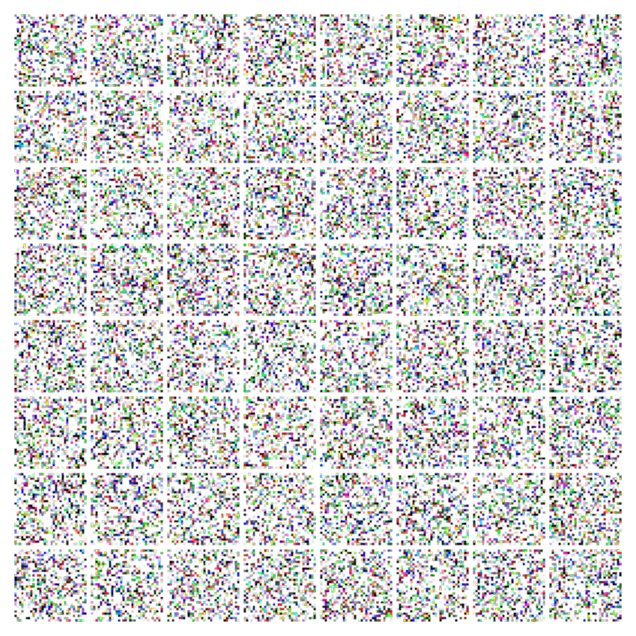

In [28]:
grid = make_grid(zt_final, nrow=8)      # 8×8 grid if batch=64

plt.figure(figsize=(8,8))
plt.imshow(grid.permute(1, 2, 0))     # CHW → HWC
plt.axis("off")
plt.show()

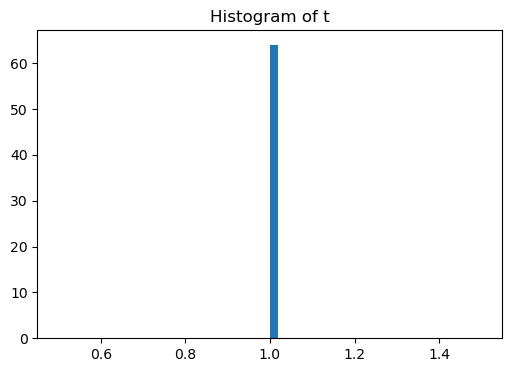

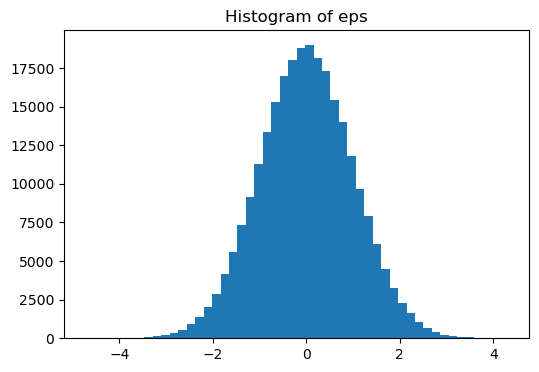

In [29]:
t_cpu = t_final.detach().cpu().flatten()
eps_cpu = eps_final.detach().cpu().flatten()

plt.figure(figsize=(6,4))
plt.hist(t_cpu, bins=50)
plt.title("Histogram of t")
plt.show()

plt.figure(figsize=(6,4))
plt.hist(eps_cpu, bins=50)
plt.title("Histogram of eps")
plt.show()

z_t_final statistics:
mean      = -0.001489
std       = 1.000564
skew      = 0.008999
kurtosis  = 3.009563



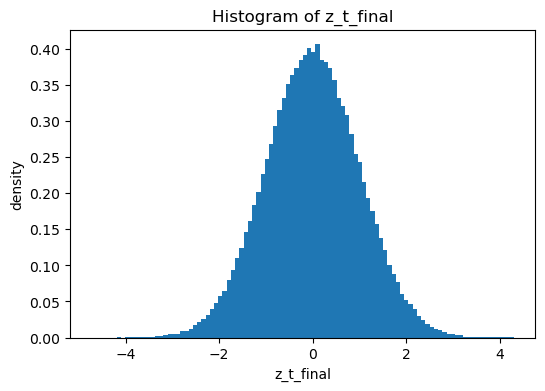

In [30]:
# Example for your z_t (after forward process)
summarize_and_plot("z_t_final", zt_final)

In [31]:
per_image_stats_average(zt_final)

Averaged per-image statistics:
mean      = -0.001489
std       = 1.000397
skew      = 0.009139
kurtosis  = 3.008318


(tensor(-0.0015), tensor(1.0004), tensor(0.0091), tensor(3.0083))

Final Mean statistics:
mean      = 0.014891
std       = 10.005635
skew      = -0.008999
kurtosis  = 3.009562



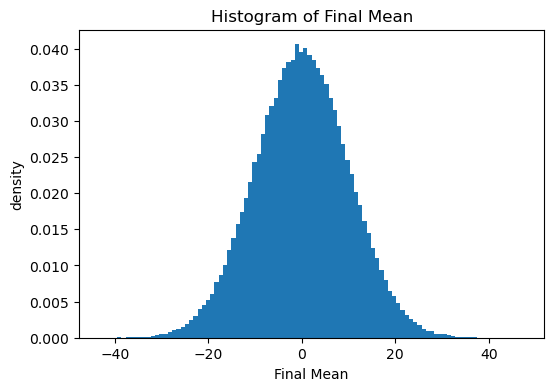

Final diffusion statistics:
mean      = 4.472136
std       = 0.000000
skew      = nan
kurtosis  = nan



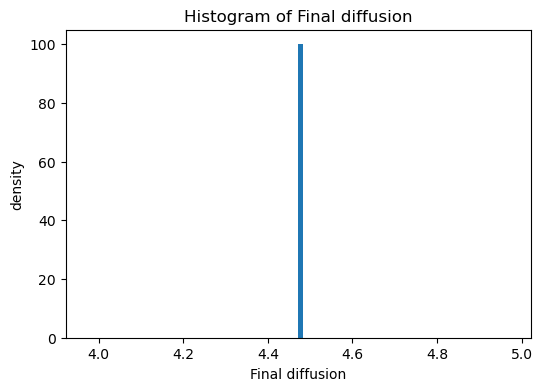

In [34]:
mean, diffusion = diffusion_process.sde.sde(zt_final, t_final)
summarize_and_plot("Final Mean", mean)
summarize_and_plot("Final diffusion", diffusion)

# In-Depth closed form analysis

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-8.152631..7.940733].


Forward process for all images at: t = 0.0


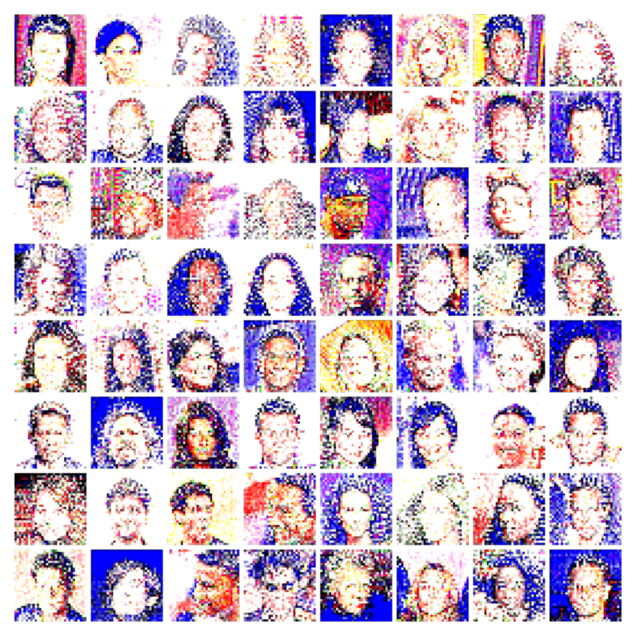

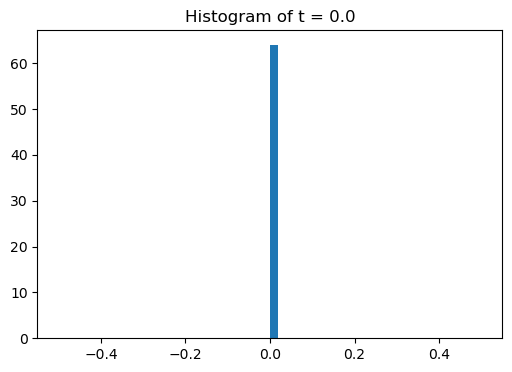

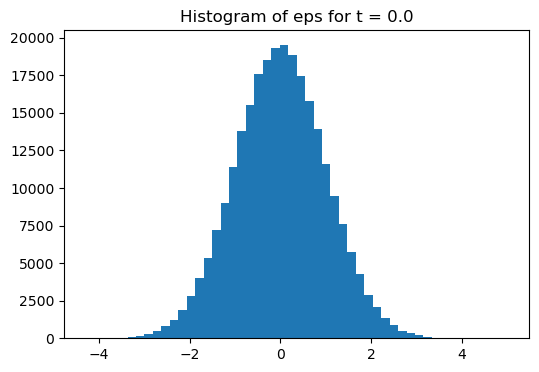

Statistics for t = 0.0 statistics:
mean      = 0.080539
std       = 0.989790
skew      = -0.224829
kurtosis  = 3.736041



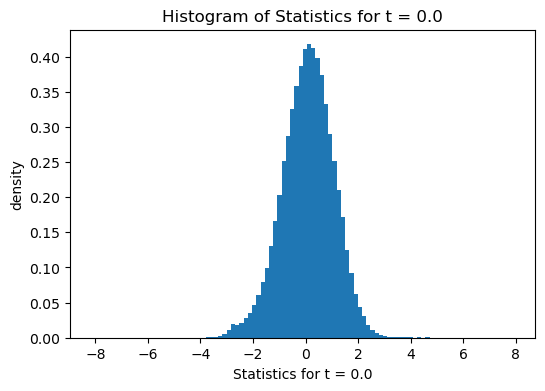

Mean for t = 0.0 statistics:
mean      = -0.004027
std       = 0.049489
skew      = 0.224829
kurtosis  = 3.736041



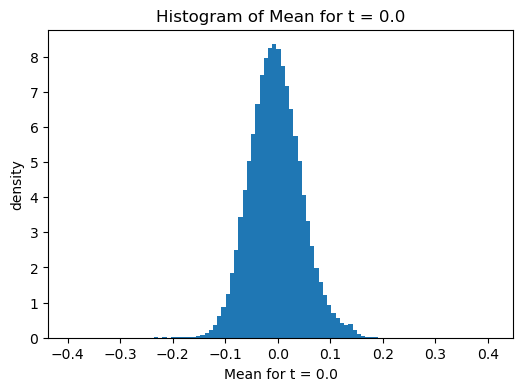

Diffusion for t = 0.0 statistics:
mean      = 0.000000
std       = 0.000000
skew      = nan
kurtosis  = nan



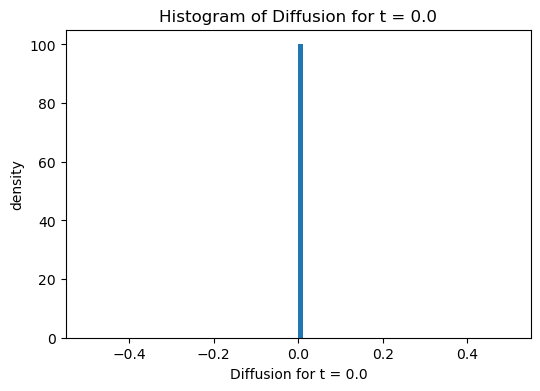

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.7368865..7.555008].


Forward process for all images at: t = 0.1


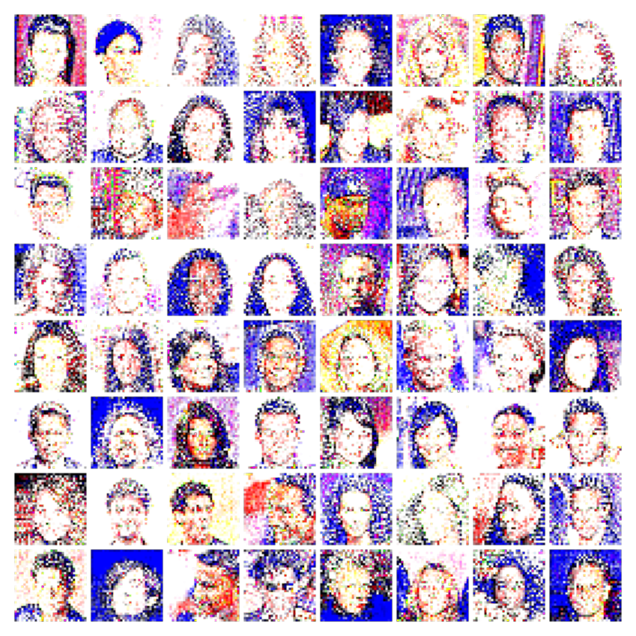

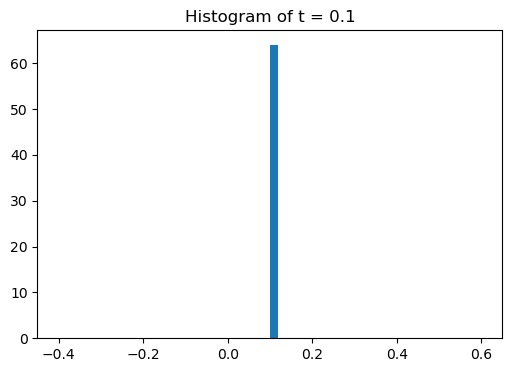

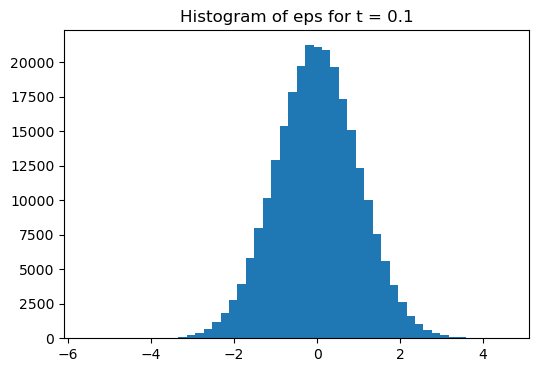

Statistics for t = 0.1 statistics:
mean      = 0.076371
std       = 0.943026
skew      = -0.222274
kurtosis  = 3.725933



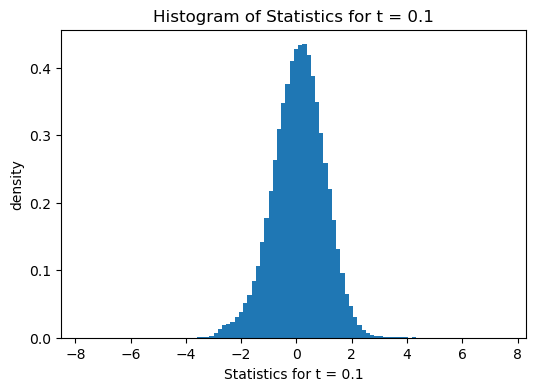

Mean for t = 0.1 statistics:
mean      = -0.079808
std       = 0.985462
skew      = 0.222274
kurtosis  = 3.725933



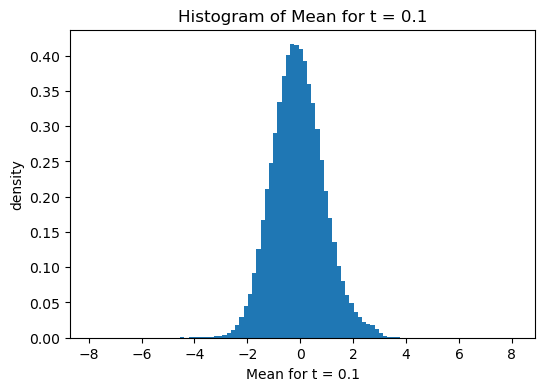

Diffusion for t = 0.1 statistics:
mean      = 0.641138
std       = 0.000000
skew      = 1.000000
kurtosis  = 1.000000



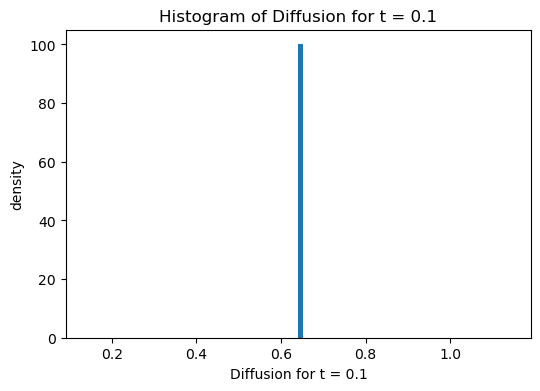

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.6488967..6.3027277].


Forward process for all images at: t = 0.2


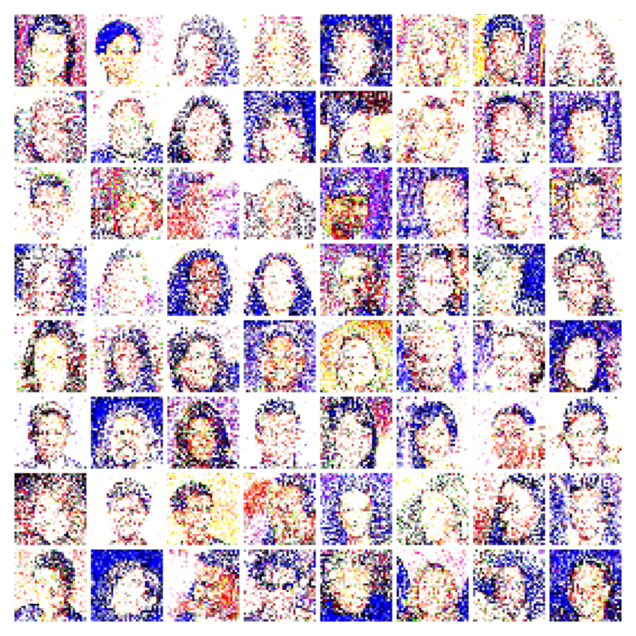

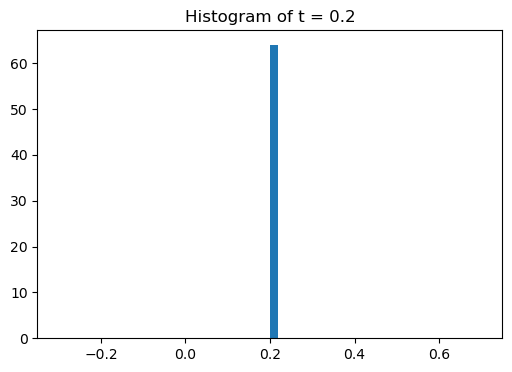

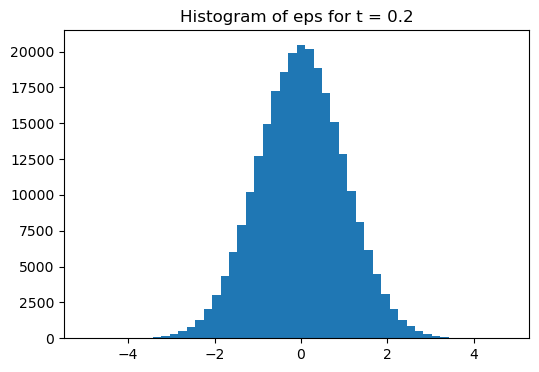

Statistics for t = 0.2 statistics:
mean      = 0.066096
std       = 0.872111
skew      = -0.179210
kurtosis  = 3.527898



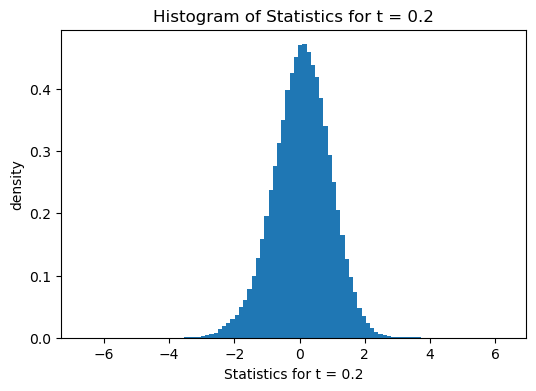

Mean for t = 0.2 statistics:
mean      = -0.134836
std       = 1.779107
skew      = 0.179210
kurtosis  = 3.527897



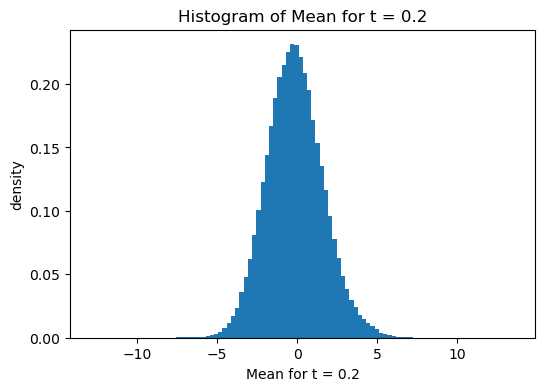

Diffusion for t = 0.2 statistics:
mean      = 1.520382
std       = 0.000000
skew      = nan
kurtosis  = nan



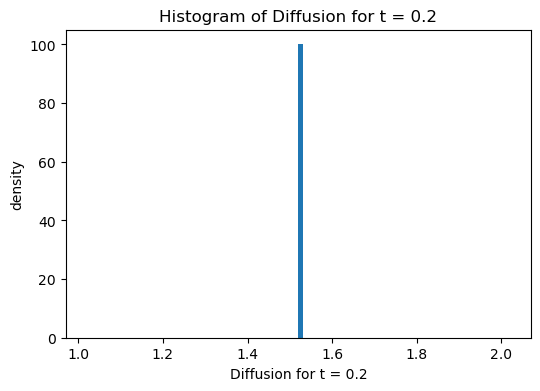

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.0801644..5.2793922].


Forward process for all images at: t = 0.3


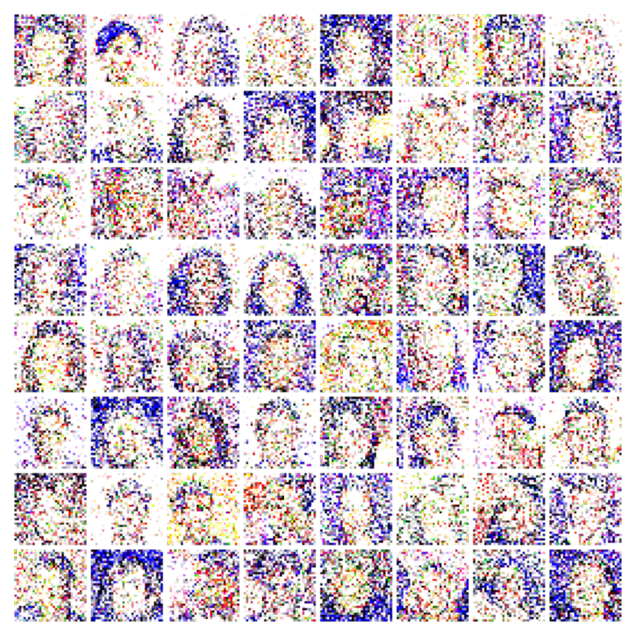

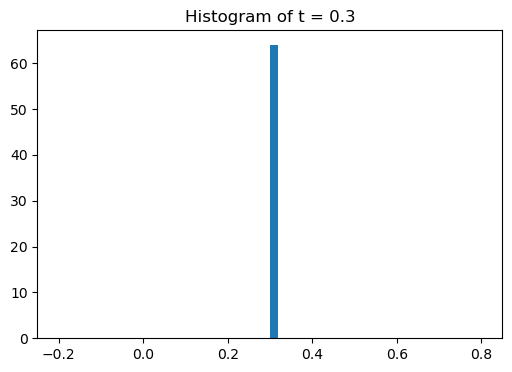

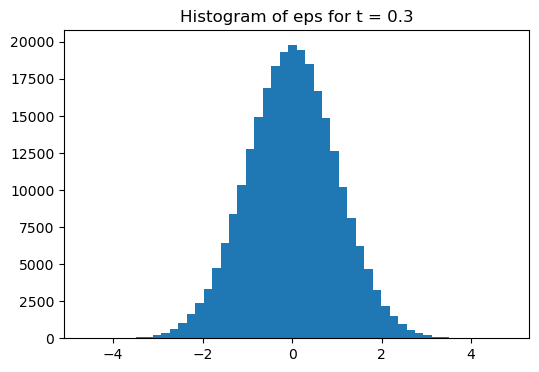

Statistics for t = 0.3 statistics:
mean      = 0.049912
std       = 0.866742
skew      = -0.082313
kurtosis  = 3.196909



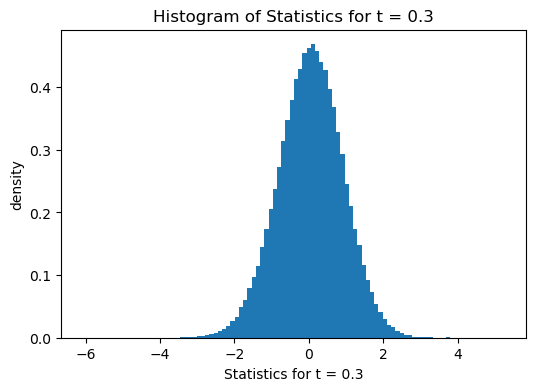

Mean for t = 0.3 statistics:
mean      = -0.151484
std       = 2.630563
skew      = 0.082313
kurtosis  = 3.196910



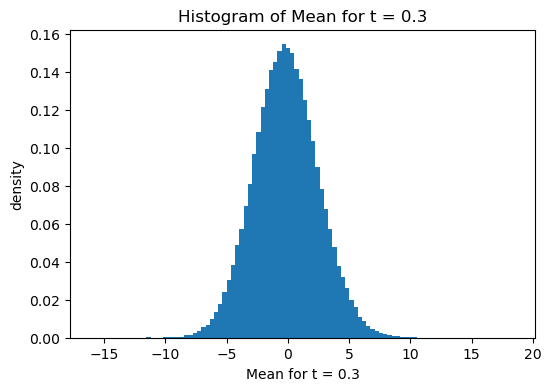

Diffusion for t = 0.3 statistics:
mean      = 2.261974
std       = 0.000000
skew      = nan
kurtosis  = nan



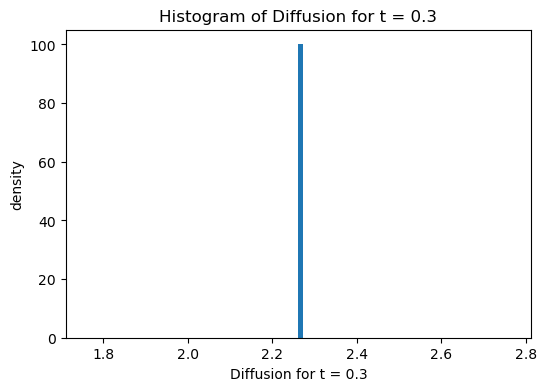

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.227404..4.5507717].


Forward process for all images at: t = 0.4


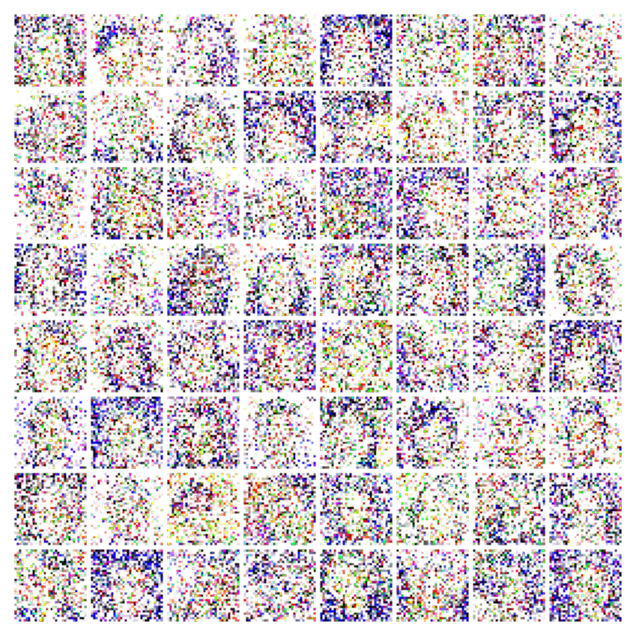

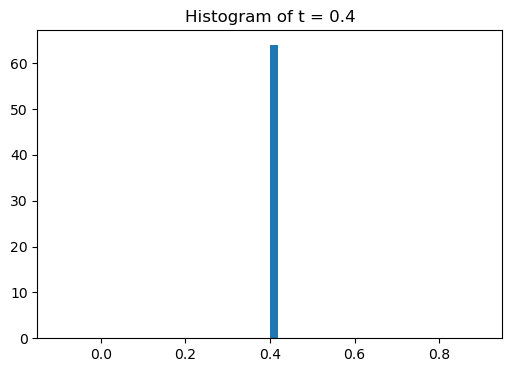

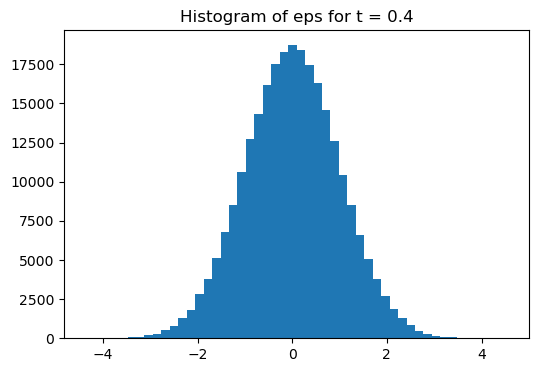

Statistics for t = 0.4 statistics:
mean      = 0.034312
std       = 0.913519
skew      = -0.027179
kurtosis  = 3.038225



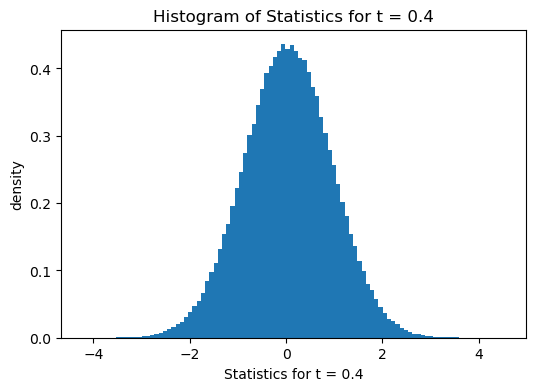

Mean for t = 0.4 statistics:
mean      = -0.138279
std       = 3.681483
skew      = 0.027179
kurtosis  = 3.038225



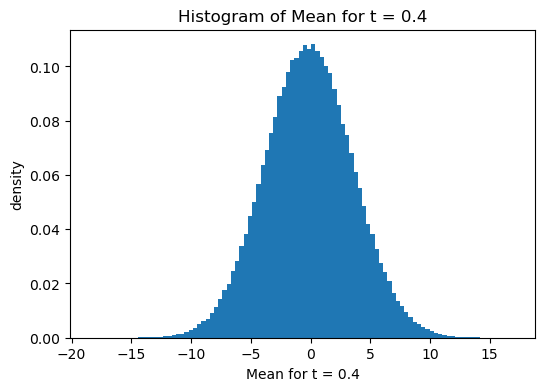

Diffusion for t = 0.4 statistics:
mean      = 2.784210
std       = 0.000000
skew      = nan
kurtosis  = nan



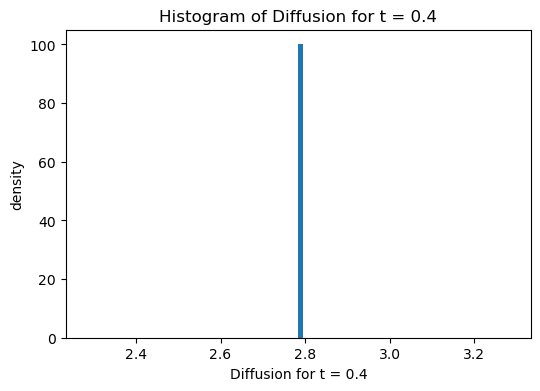

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.7207394..4.5423393].


Forward process for all images at: t = 0.5


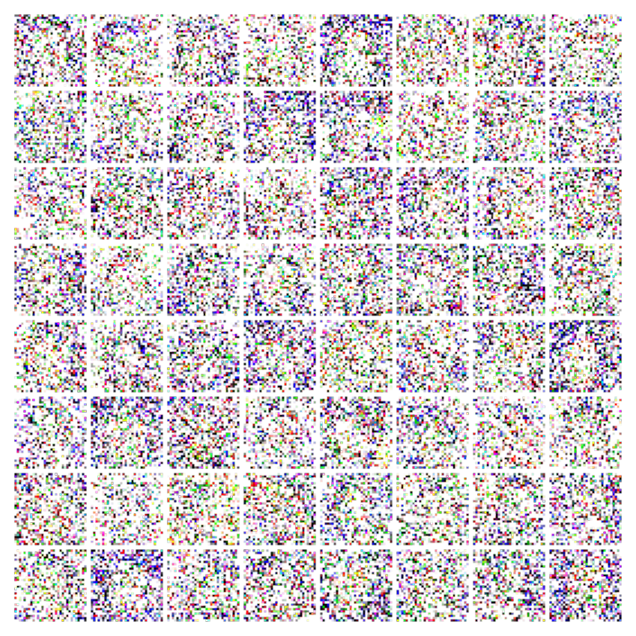

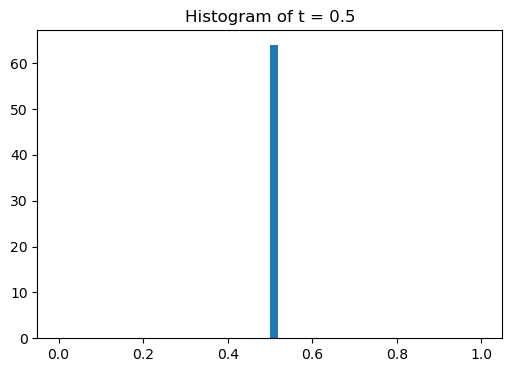

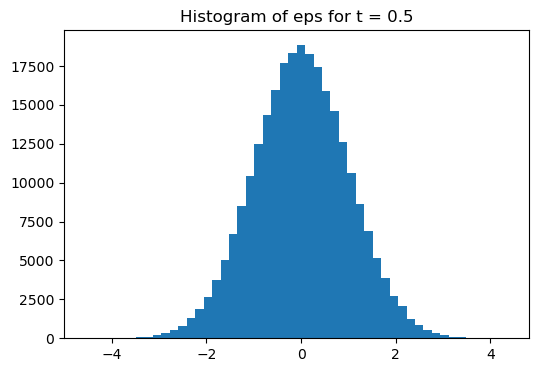

Statistics for t = 0.5 statistics:
mean      = 0.023486
std       = 0.963441
skew      = -0.006858
kurtosis  = 3.003078



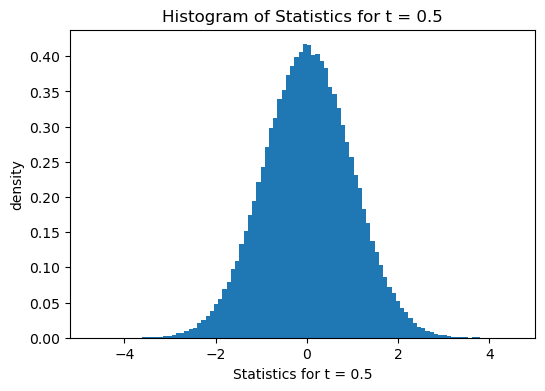

Mean for t = 0.5 statistics:
mean      = -0.118019
std       = 4.841291
skew      = 0.006858
kurtosis  = 3.003078



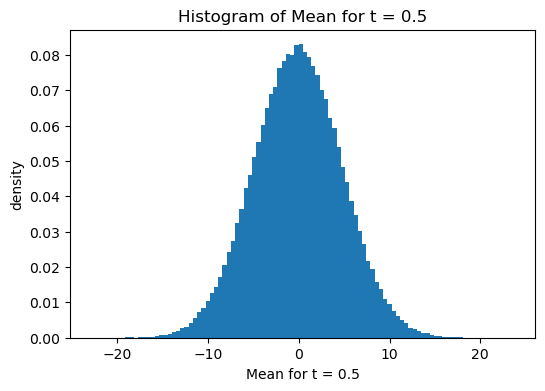

Diffusion for t = 0.5 statistics:
mean      = 3.160249
std       = 0.000000
skew      = nan
kurtosis  = nan



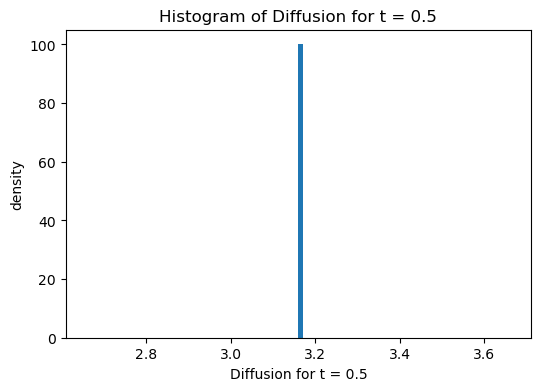

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.340341..4.4051623].


Forward process for all images at: t = 0.6


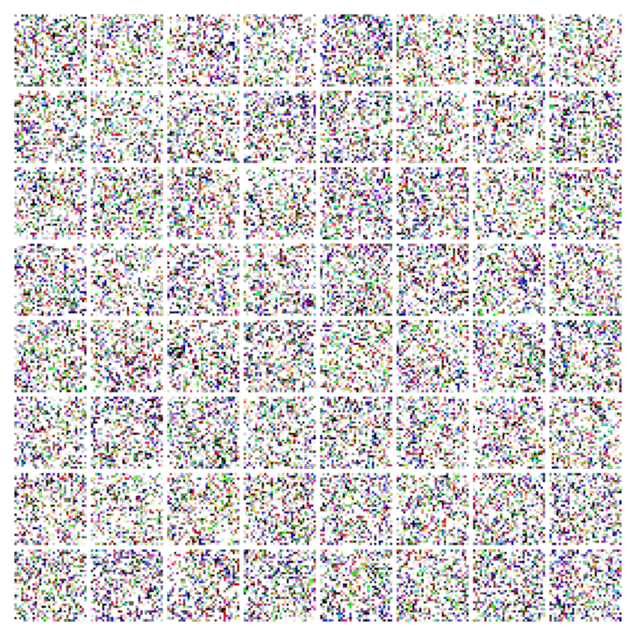

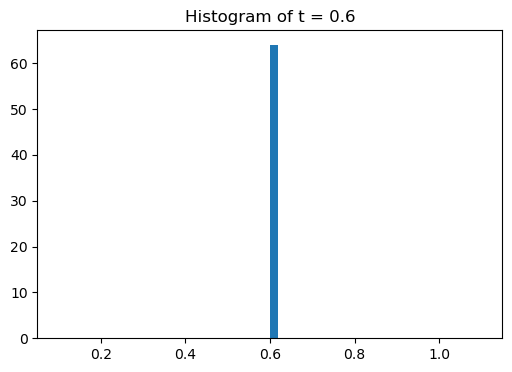

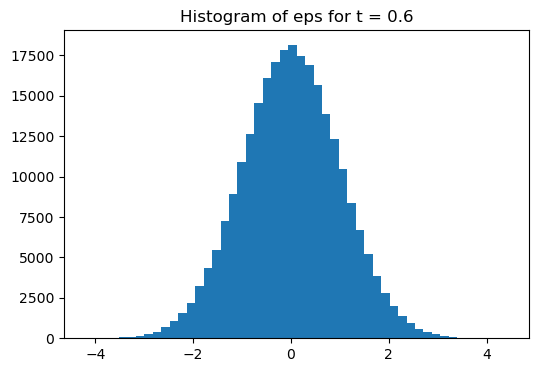

Statistics for t = 0.6 statistics:
mean      = 0.014812
std       = 0.987682
skew      = -0.003326
kurtosis  = 2.986536



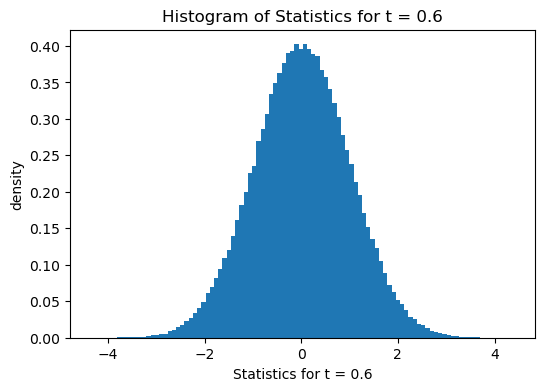

Mean for t = 0.6 statistics:
mean      = -0.089171
std       = 5.945845
skew      = 0.003326
kurtosis  = 2.986537



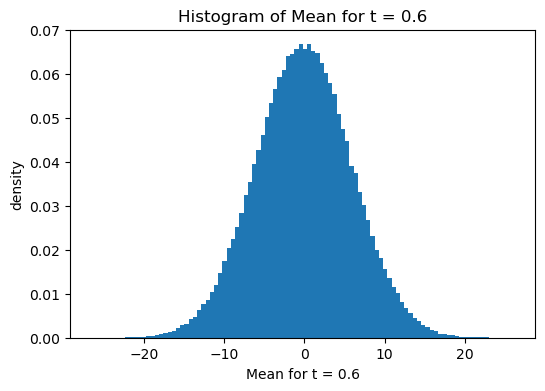

Diffusion for t = 0.6 statistics:
mean      = 3.468679
std       = 0.000000
skew      = nan
kurtosis  = nan



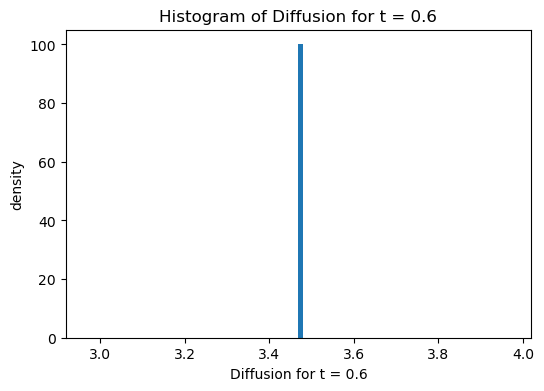

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.4035034..4.4731994].


Forward process for all images at: t = 0.7


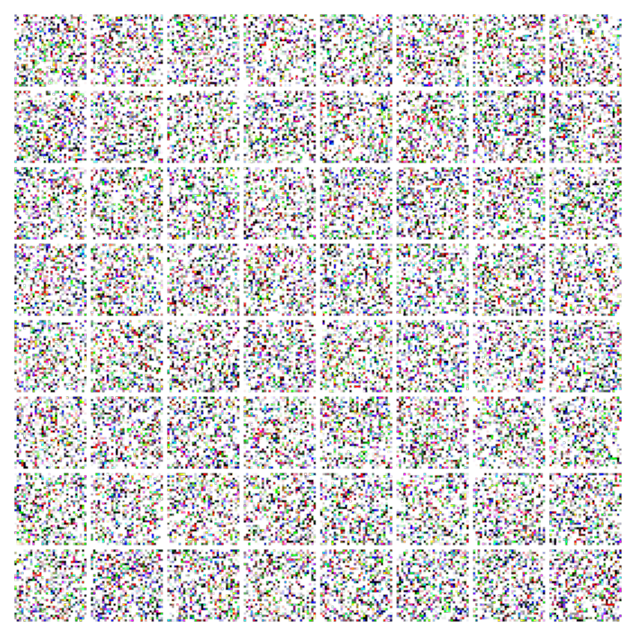

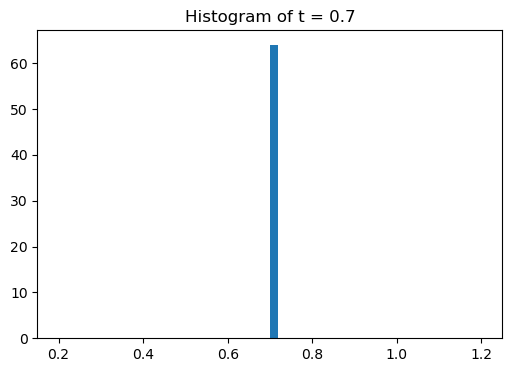

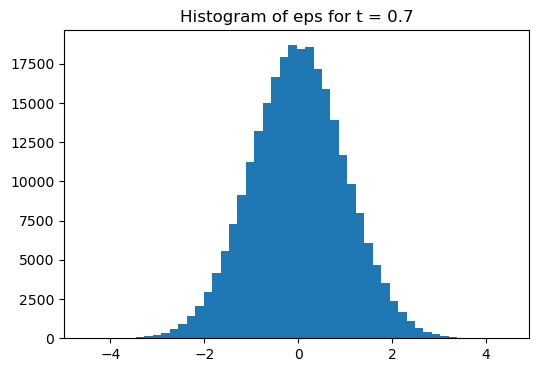

Statistics for t = 0.7 statistics:
mean      = 0.004178
std       = 0.997894
skew      = -0.005317
kurtosis  = 3.000882



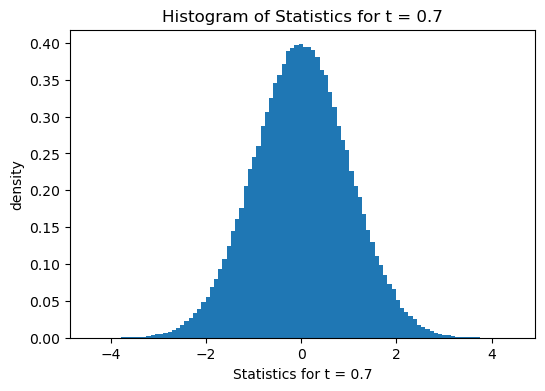

Mean for t = 0.7 statistics:
mean      = -0.029310
std       = 7.000225
skew      = 0.005317
kurtosis  = 3.000882



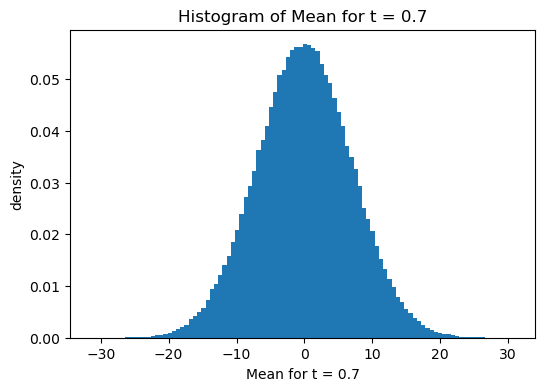

Diffusion for t = 0.7 statistics:
mean      = 3.745569
std       = 0.000000
skew      = nan
kurtosis  = nan



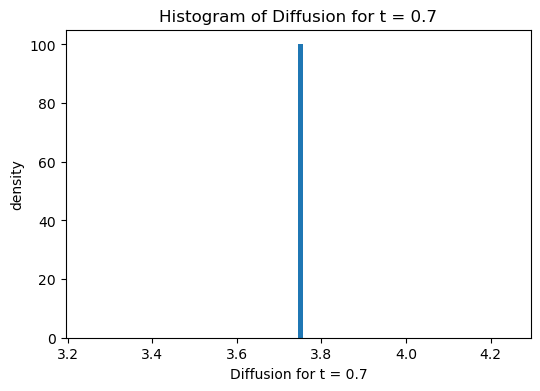

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.5855756..4.74012].


Forward process for all images at: t = 0.8


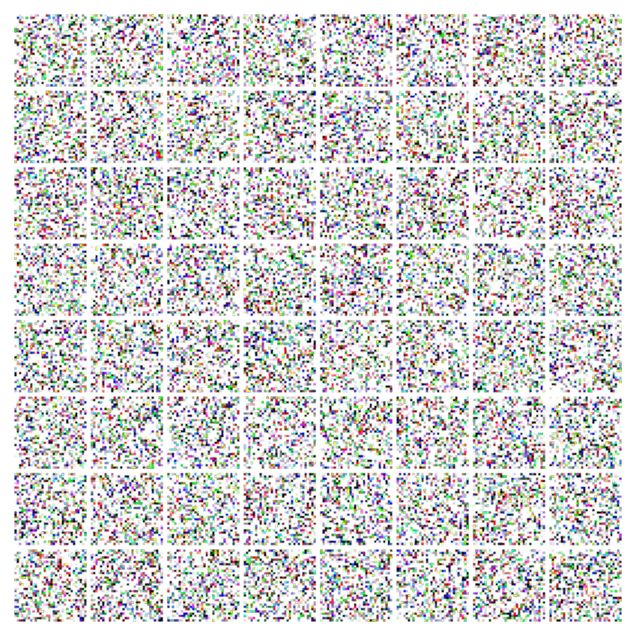

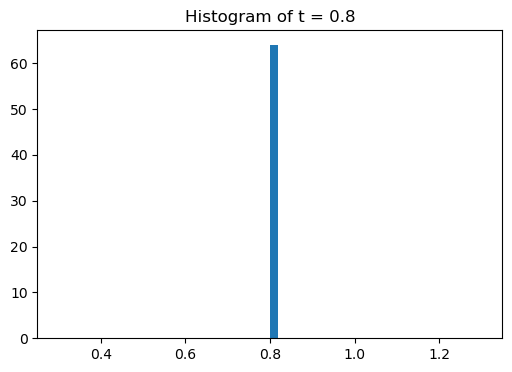

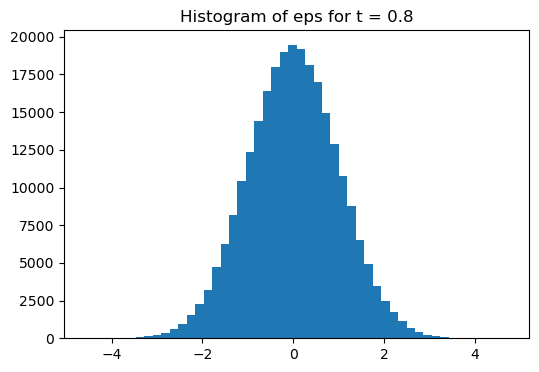

Statistics for t = 0.8 statistics:
mean      = 0.006950
std       = 0.997963
skew      = -0.000945
kurtosis  = 2.991209



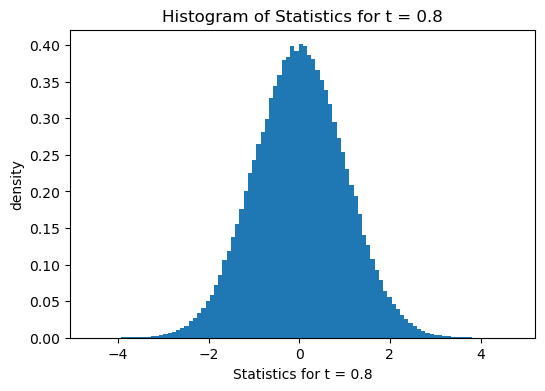

Mean for t = 0.8 statistics:
mean      = -0.055669
std       = 7.993688
skew      = 0.000945
kurtosis  = 2.991208



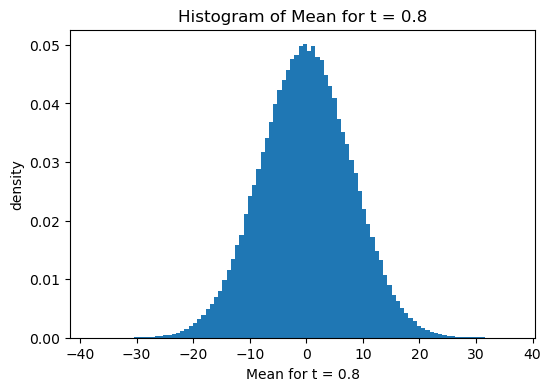

Diffusion for t = 0.8 statistics:
mean      = 4.002494
std       = 0.000000
skew      = nan
kurtosis  = nan



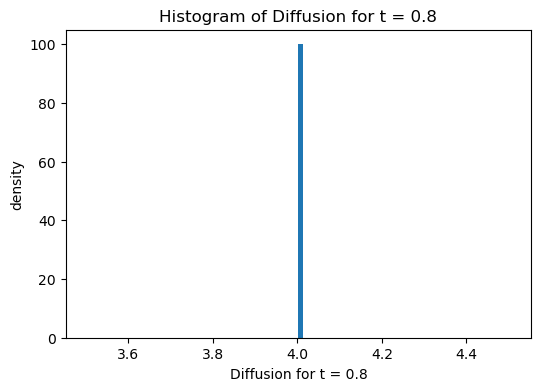

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.8510523..4.8393226].


Forward process for all images at: t = 0.9


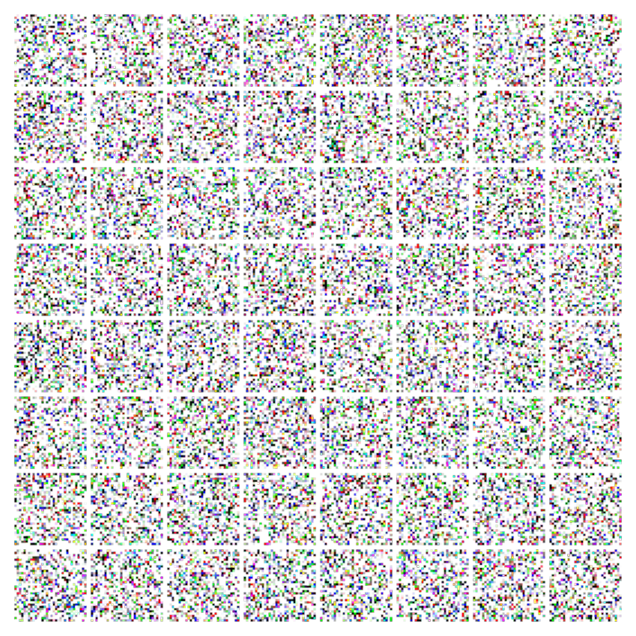

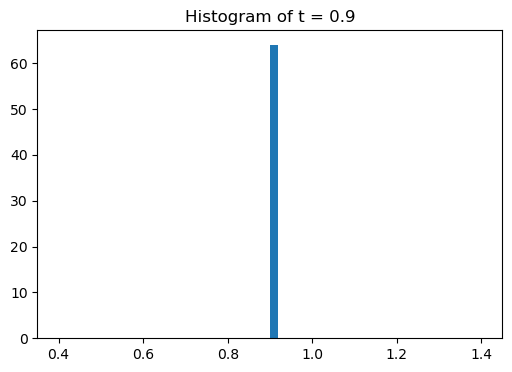

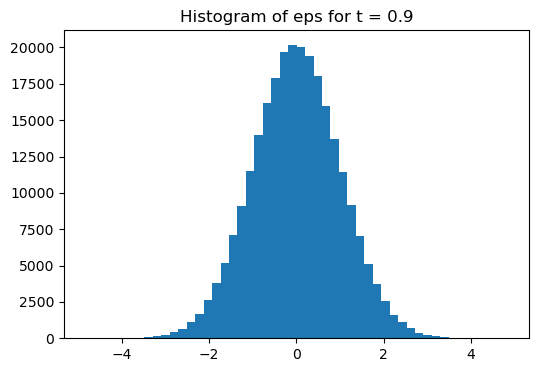

Statistics for t = 0.9 statistics:
mean      = 0.001514
std       = 1.000705
skew      = 0.000445
kurtosis  = 3.001767



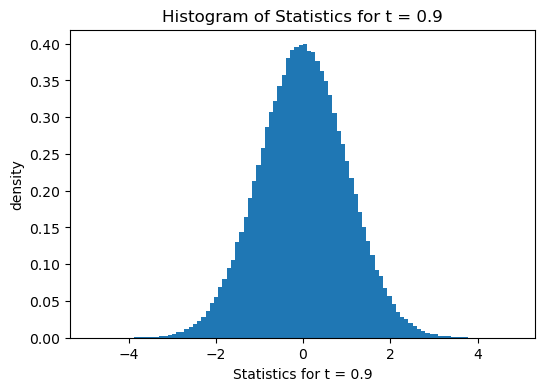

Mean for t = 0.9 statistics:
mean      = -0.013629
std       = 9.011348
skew      = -0.000445
kurtosis  = 3.001767



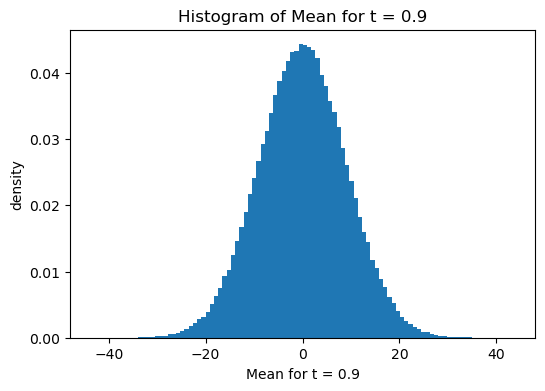

Diffusion for t = 0.9 statistics:
mean      = 4.243819
std       = 0.000000
skew      = nan
kurtosis  = nan



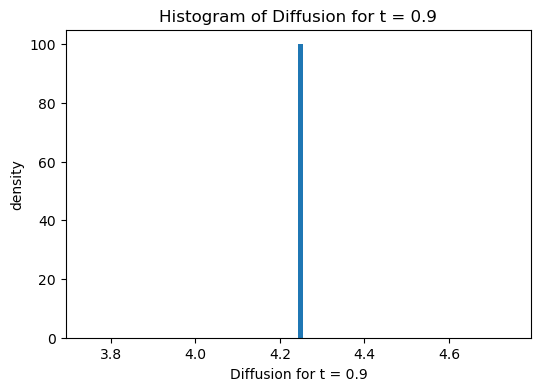

In [37]:
for i in range(10):
    print(f"Forward process for all images at: t = {round(i/10,2)}")
    times = torch.ones(latents.size(0)) * i/10
    zt, t, eps = diffusion_process.forward_process(latents, times)

    grid = make_grid(zt, nrow=8)      # 8×8 grid if batch=64

    plt.figure(figsize=(8,8))
    plt.imshow(grid.permute(1, 2, 0))     # CHW → HWC
    plt.axis("off")
    plt.show()

    t_cpu = t.detach().cpu().flatten()
    eps_cpu = eps.detach().cpu().flatten()
    
    plt.figure(figsize=(6,4))
    plt.hist(t_cpu, bins=50)
    plt.title(f"Histogram of t = {i/10}")
    plt.show()
    
    plt.figure(figsize=(6,4))
    plt.hist(eps_cpu, bins=50)
    plt.title(f"Histogram of eps for t = {i/10}")
    plt.show()

    # Example for your z_t (after forward process)
    summarize_and_plot(f"Statistics for t = {i/10}", zt)

    mean, diffusion = diffusion_process.sde.sde(zt, t)
    summarize_and_plot(f"Mean for t = {i/10}", mean)
    summarize_and_plot(f"Diffusion for t = {i/10}", diffusion)

# Diffusion Coefficient evolution

In [39]:
for i in range(10):
    t = torch.full((latents.size(0),), i/10, device=latents.device)
    _, _, _ = diffusion_process.forward_process(latents, t)

    _, diffusion = diffusion_process.sde.sde(latents, t)
    print(f"t={i/10:.1f}, diffusion={diffusion[0].item():.6f}")

t=0.0, diffusion=0.000000
t=0.1, diffusion=0.641138
t=0.2, diffusion=1.520382
t=0.3, diffusion=2.261974
t=0.4, diffusion=2.784210
t=0.5, diffusion=3.160249
t=0.6, diffusion=3.468679
t=0.7, diffusion=3.745569
t=0.8, diffusion=4.002494
t=0.9, diffusion=4.243819
